In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from matplotlib.lines import Line2D
from matplotlib.legend_handler import HandlerTuple
import matplotlib

from brokenaxes import brokenaxes

In [8]:
##  PLOS

plt.rcParams.update({
    # Fonts - Times, 8-12 pt
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times"],
    "font.size": 12,                  # Base size 8-12 pt

    # Axes
    "axes.titlesize": 12,             # Axis title size
    "axes.labelsize": 12,             # Axis label size
    "axes.labelweight": "normal",     # Normal weight
    "axes.titleweight": "normal",     # Normal weight for titles

    # Ticks
    "xtick.labelsize": 9,             # X tick label size (8-12)
    "ytick.labelsize": 9,             # Y tick label size (8-12)
    "xtick.direction": "in",          # Tick direction
    "ytick.direction": "in",          # Tick direction

    # Legends
    "legend.fontsize": 12,            # Legend text size (8-12)
    "legend.title_fontsize": 12,      # Legend title size (8-12)
    "legend.loc": 'best',             # Automatic location

    # Resolution
    "figure.dpi": 500,                # Display DPI
    "savefig.dpi": 500,               # Save DPI (300-600)
    "savefig.bbox": "tight",          # Crop whitespace

    # Without LaTeX
    "text.usetex": False,             # PLOS does not accept LaTeX EPS
    "mathtext.fontset": "dejavuserif",# Match math fonts to serif

    # Figsize ?
    # "figure.figsize": (16, 6),       # Figsize
    # "figure.figsize": (8, 6),       # Figsize
    # Make text editable in Inkscape
    "svg.fonttype": 'none',
})

In [9]:
## Reusable color utility
# I use this one
import numpy as np
import matplotlib.pyplot as plt

def make_color_map(values, cmap, vmin=0.25, vmax=1.0):
    '''
    Function that takes array of values and make a colormap for them
    '''
    values_sorted = sorted(values)
    colors = cmap(np.linspace(vmin, vmax, len(values)))
    return dict(zip(values_sorted, colors))

# To be given value
v_rest = [-22, -17, -12.3, -8.5]
pqif_vector = [0, 0.25, 0.5, 0.75, 1]

# Make colors once
color_map_vrest = make_color_map(v_rest, plt.cm.Reds)  # Reds for vrest
color_map_pqif = make_color_map(pqif_vector[1:-1], plt.cm.Greens)  # Greens for pqif

# Explicit endpoints for pqif
color_map_pqif[pqif_vector[0]] = 'black'
color_map_pqif[pqif_vector[-1]] = 'steelblue'


In [13]:
import pandas as pd
from pathlib import Path

# -----------------------------
# 1. Create a simple DataFrame
# -----------------------------
data = {
    "name": ["Alice", "Bob", "Charlie"],
    "age": [25, 30, 35],
    "score": [88.5, 92.0, 79.5],
}

df = pd.DataFrame(data)

# -----------------------------
# 2. Define OneDrive path
# -----------------------------
# Example (Windows):
# Path(r"C:\Users\YourUsername\OneDrive\test_folder")
#
# Example (Mac):
# Path("/Users/YourUsername/OneDrive/test_folder")

# Onedrive base where evertything will be saved
ONEDRIVE_BASE = Path(r"C:\Users\Silje\OneDrive\Dokumenter\mscneuroscience20242026\nevr3901\simulations_folder")

# Optional: ensure the folder exists
ONEDRIVE_BASE.mkdir(parents=True, exist_ok=True)

# -----------------------------
# 3. Save DataFrame to CSV
# -----------------------------
# csv_path = ONEDRIVE_BASE / "new_test_dataframe.csv"
# df.to_csv(csv_path, index=False)

# print(f"CSV file successfully saved to:\n{csv_path}")




In [ ]:
########## New version

# ========== Quantification of breakdown between subpopulations ==========

import pandas as pd
import numpy as np
import matplotlib
import sys


########## Loop variables ##########
vrest = [-8.5, -12.3, -17, -22]
slope = [14.44, 10.68, 8.65, 7.18]
slope_qif = 10.74
all_slopes = [14.44, 10.68, 10.74, 8.65, 7.18]

pqif_number = [0, 0.25, 0.5, 0.75, 1]
pqif_homogenous = [0, 1]
pqif_heterogenous = [0.25, 0.5, 0.75]


dynamics = ['oscillations', 'sequences']
# dynamics = ['oscillations']
seed_number = [i for i in range(0, 50)]


########## Figure variables ##########
x = [1, 2, 3, 4]  # q1...q4
x_ticks = [(rf"QIF $\rightarrow$ QIF"), (rf"LIF $\rightarrow$ QIF"), (rf"QIF $\rightarrow$ LIF"), (rf"LIF $\rightarrow$ LIF")]


########## Make dataframe with necessary valyes ##########

rows = []  # Will be a dataframe with all values needed
weights_dict = {}
weights_filtered_dict = {}

quad_weights_dict = {}
quad_weights_filtered_dict = {}

## Omit
eps = 1e-8  # remove almost only zeros
# eps = 1e-6
# eps = 1e-4
# eps = 1e-3  # aggressive


# Path
import os
from pathlib import Path

base = Path.cwd().parent


for dyn in dynamics:

    simulation_number = [i for i in range(1,5)] if dyn == 'oscillations' else [i for i in range(9,13)]

    for pqif in pqif_heterogenous:


        for sim, vr, f in zip(simulation_number, vrest, slope):


            for seed in seed_number:

                # ------------------------------ Get connectivity matrix ------------------------------


                ##### Access total weight matrix
                # df = pd.read_csv(ONEDRIVE_BASE / f'simulation_{sim}_connectivity_matrix\simulation_{sim}_connectivity_pqif_{pqif}_iloop_11_seed_{seed}', header=None)

                # ------------------------------ Initial matrix (with zero weights) ------------------------------
                file_path_iloop_0 = f"{dyn}\simulation_{sim}\simulation_{sim}_connectivity_matrix\simulation_{sim}_connectivity_pqif_{pqif}_iloop_0_seed_{seed}"

                M = np.loadtxt(file_path_iloop_0, delimiter=',')

                # ------------------------------ print some info about it ------------------------------

                zeros = M == 0  # matrix indicating which weights were initialized to zero
                num_zero_weights = np.sum(zeros)
                num_non_zero_weights = np.sum(~zeros)
                frac_zero_weights = f"{np.sum(zeros) / M.size:.2f}" # should be around 0.7

                # ------------------------------ Matrix after training ------------------------------

                # Load matrix
                file_path_iloop_11 = f'{dyn}\simulation_{sim}\simulation_{sim}_connectivity_matrix\simulation_{sim}_connectivity_pqif_{pqif}_iloop_11_seed_{seed}'
                M_final = np.loadtxt(file_path_iloop_11, delimiter=',')
                M_final_filt = M_final[~zeros]  # initialized above

                # weights_df = pd.DataFrame(M_final_filt)





                weights_df = pd.read_csv(f"{dyn}/simulation_{sim}/simulation_{sim}_connectivity_matrix/simulation_{sim}_connectivity_pqif_{pqif}_iloop_11_seed_{seed}", header=None)


                
                # path = base / f"{dyn}" / f"simulation_{sim}/simulation_{sim}_connectivity_matrix/simulation_{sim}_connectivity_pqif_{pqif}_iloop_11_seed_{seed}.csv"


                simulation_id = f'{dyn}_{sim}_{pqif}_{seed}'  # Shared across dataframe and dictionary

                # ------------------------------ Global info: With and without omitting ------------------------------

                ## Original
                weights_np = weights_df.to_numpy()  # Make numpy representation of dataframe
                weights = weights_np.flatten()  # Flatten to 1D array

                std_all = np.std(weights)
                mean_all = np.mean(weights)

                weights_dict[simulation_id] = weights  # Dictionary mapping simulationID to weight 


                weights_filtered = weights[(weights != 0) & (np.abs(weights) > eps)]
                weights_filtered_dict[simulation_id] = weights_filtered

                mean_all_filtered = weights_filtered.mean()
                std_all_filtered = weights_filtered.std()


                # For stats later
                if pqif == 1:
                    vr = None
                    f = slope_qif

                # ------------------------------ Subpop: Slice into submatrices ------------------------------

                
                weights_all_df = weights_df.copy()

                r, c = weights_all_df.shape  # rows, columns (type: int)

                r_cut = int(r * pqif)  # first pqif_num rows are QIF
                c_cut = int(c * pqif)  # first pqif_num columns are QIF


                ## Make quadrants based on cut
                # (Row, column start with QIF up to pqif)
                # Columns are presynaptic, rows are postsynaptic
                q1 = weights_all_df.iloc[:r_cut, :c_cut].copy()  # qif-->qif
                q2 = weights_all_df.iloc[:r_cut, c_cut:].copy()  # lif-->qif   
                q3 = weights_all_df.iloc[r_cut:, :c_cut].copy()  # qif-->lif
                q4 = weights_all_df.iloc[r_cut:, c_cut:].copy()  # lif --> lif

                
                # Naming
                list_of_quadrants = [q1, q2, q3, q4]
                q_i = [f"q{i}" for i in range(1, len(list_of_quadrants) +1)]
                names = ['QIF→QIF', 'LIF→QIF', 'QIF→LIF', 'LIF→LIF']
                stringlist_of_quadrants = ['q1', 'q2', 'q3', 'q4']

                quadrants = {
                    "q1": q1,
                    "q2": q2,
                    "q3": q3,
                    "q4": q4
                }

                for quad_name, q in quadrants.items():
                    shape = q.shape
                    weights = q.values.flatten()
                    weights_filtered = weights[(weights != 0) & (np.abs(weights) > eps)]

                    # ---- Save arrays ----
                    quad_weights_dict[f"{simulation_id}_{quad_name}"] = weights
                    quad_weights_filtered_dict[f"{simulation_id}_{quad_name}"] = weights_filtered

                    # ---- Compute stats ----

                    mean_q = weights.mean()
                    std_q = weights.std()

                    mean_q_filtered = weights_filtered.mean()
                    std_q_filtered = weights_filtered.std()

                    row = [
                        dyn, 
                        pqif, 
                        seed, 
                        sim, 
                        vr, 
                        f, 
                        quad_name, 
                        shape, 
                        mean_q, 
                        std_q,
                        mean_all,
                        std_all,
                        mean_all_filtered, 
                        std_all_filtered
                    ]

                    rows.append(row)



columns = ['dyn', 'pqif', 'seed', 'sim', 'vr', 'f', 'quadrant', 'shape', 'mean_q', 'std_q', 'mean_all', 'std_all', 'mean_all_filtered', 'std_all_filtered']
df_subpop_org = pd.DataFrame(rows, columns=columns)

df_subpop = df_subpop_org.copy() # This copy now contains all values needed to plot these types of figures, and the quad_weights dictionaries to plot histos

display(df_subpop)

df_subpop.to_csv("subpopulations_heterogenous_with_filters_stats.csv", index=False)


########## Figure plotting ##########


,dyn,pqif,seed,sim,vr,f,quadrant,shape,mean_q,std_q,mean_all,std_all,mean_all_filtered,std_all_filtered
0,oscillations,0.25,0,1,-8.5,14.44,q1,"(50, 50)",0.009582,0.269830,0.000327,0.252220,0.001097,0.461682
1,oscillations,0.25,0,1,-8.5,14.44,q2,"(50, 150)",-0.002763,0.271055,0.000327,0.252220,0.001097,0.461682
2,oscillations,0.25,0,1,-8.5,14.44,q3,"(150, 50)",0.002895,0.259967,0.000327,0.252220,0.001097,0.461682
3,oscillations,0.25,0,1,-8.5,14.44,q4,"(150, 150)",-0.000526,0.240769,0.000327,0.252220,0.001097,0.461682
4,oscillations,0.25,1,1,-8.5,14.44,q1,"(50, 50)",-0.009294,0.254104,0.000172,0.240952,0.000575,0.441149
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4795,sequences,0.75,48,12,-22.0,7.18,q4,"(50, 50)",0.067854,0.198802,0.022383,0.209134,0.075028,0.377702
4796,sequences,0.75,49,12,-22.0,7.18,q1,"(150, 150)",0.009442,0.212571,0.022152,0.214222,0.074249,0.387231
4797,sequences,0.75,49,12,-22.0,7.18,q2,"(150, 50)",0.060951,0.212590,0.022152,0.214222,0.074249,0.387231
4798,sequences,0.75,49,12,-22.0,7.18,q3,"(50, 150)",0.006014,0.210364,0.022152,0.214222,0.074249,0.387231


In [24]:
########## New version

# ========== Quantification of breakdown between subpopulations ==========

import pandas as pd
import numpy as np
import matplotlib
import sys


########## Loop variables ##########
vrest = [-8.5, -12.3, -17, -22]
slope = [14.44, 10.68, 8.65, 7.18]
slope_qif = 10.74
all_slopes = [14.44, 10.68, 10.74, 8.65, 7.18]

pqif_number = [0, 0.25, 0.5, 0.75, 1]
pqif_homogenous = [0, 1]
pqif_heterogenous = [0.25, 0.5, 0.75]


dynamics = ['oscillations', 'sequences']
# dynamics = ['oscillations']
seed_number = [i for i in range(0, 50)]


########## Figure variables ##########
x = [1, 2, 3, 4]  # q1...q4
x_ticks = [(rf"QIF $\rightarrow$ QIF"), (rf"LIF $\rightarrow$ QIF"), (rf"QIF $\rightarrow$ LIF"), (rf"LIF $\rightarrow$ LIF")]


########## Make dataframe with necessary valyes ##########

rows = []  # Will be a dataframe with all values needed
weights_dict = {}
weights_filtered_dict = {}

quad_weights_dict = {}
quad_weights_filtered_dict = {}

## Omit
eps = 1e-8  # remove almost only zeros
# eps = 1e-6
# eps = 1e-4
# eps = 1e-3  # aggressive


# Path
import os
from pathlib import Path

base = Path.cwd().parent


for dyn in dynamics:

    simulation_number = [i for i in range(1,5)] if dyn == 'oscillations' else [i for i in range(9,13)]

    for pqif in pqif_heterogenous:


        for sim, vr, f in zip(simulation_number, vrest, slope):


            for seed in seed_number:

                simulation_id = f'{dyn}_{sim}_{pqif}_{seed}'  # Shared across dataframe and dictionary

                # ------------------------------ Get connectivity matrix ------------------------------


                # ------------------------------ Initial matrix (with zero weights) ------------------------------
                # file_path_iloop_0 = f"{dyn}\simulation_{sim}\simulation_{sim}_connectivity_matrix\simulation_{sim}_connectivity_pqif_{pqif}_iloop_0_seed_{seed}"

                file_path_iloop_0 = ONEDRIVE_BASE / f"simulation_{sim}_connectivity_matrix\simulation_{sim}_connectivity_pqif_{pqif}_iloop_0_seed_{seed}"

                M = np.loadtxt(file_path_iloop_0, delimiter=',')

                # ------------------------------ Find where weights are initialized as zero, save some info ------------------------------

                zeros = M == 0  # matrix indicating which weights were initialized to zero
                num_zero_weights = np.sum(zeros)
                num_non_zero_weights = np.sum(~zeros)
                frac_zero_weights = f"{np.sum(zeros) / M.size:.2f}" # should be around 0.7

                # ------------------------------ Matrix after training ------------------------------

                # Load matrix
                # file_path_iloop_11 = f'{dyn}\simulation_{sim}\simulation_{sim}_connectivity_matrix\simulation_{sim}_connectivity_pqif_{pqif}_iloop_11_seed_{seed}'

                file_path_iloop_11 = ONEDRIVE_BASE / f"simulation_{sim}_connectivity_matrix\simulation_{sim}_connectivity_pqif_{pqif}_iloop_0_seed_{seed}"

                M_final = np.loadtxt(file_path_iloop_11, delimiter=',')

                M_final_filt = M_final[~zeros]  # Final matrix, but omit those weights that were initialized as zero

                weights_df = pd.DataFrame(M_final_filt)  # Filtered weights df


                # Make a dataframe
                df_final = pd.DataFrame(M_final)
                df_final_filt = df_final.mask(zeros)


                # ------------------------------ Global info: With and without omitting ------------------------------

                ## Original
                # weights_np = weights_df.to_numpy()  # Make numpy representation of dataframe with filtered weights
                # weights = weights_np.flatten()  # Flatten to 1D array
                weights = M_final_filt.flatten()

                std_all = np.std(weights)
                mean_all = np.mean(weights)

                weights_dict[simulation_id] = weights  # Dictionary mapping simulationID to weight for global matrix


                # For stats later
                if pqif == 1:
                    vr = None
                    f = slope_qif

                # ------------------------------ Subpop: Slice into submatrices ------------------------------

                
                weights_all_df = df_final_filt.copy()

                r, c = weights_all_df.shape  # rows, columns (type: int)

                r_cut = int(r * pqif)  # first pqif_num rows are QIF
                c_cut = int(c * pqif)  # first pqif_num columns are QIF


                ## Make quadrants based on cut
                # (Row, column start with QIF up to pqif)
                # Columns are presynaptic, rows are postsynaptic
                q1 = weights_all_df.iloc[:r_cut, :c_cut].copy()  # qif-->qif
                q2 = weights_all_df.iloc[:r_cut, c_cut:].copy()  # lif-->qif   
                q3 = weights_all_df.iloc[r_cut:, :c_cut].copy()  # qif-->lif
                q4 = weights_all_df.iloc[r_cut:, c_cut:].copy()  # lif --> lif

                
                # Naming
                # list_of_quadrants = [q1, q2, q3, q4]
                # q_i = [f"q{i}" for i in range(1, len(list_of_quadrants) +1)]
                # names = ['QIF→QIF', 'LIF→QIF', 'QIF→LIF', 'LIF→LIF']
                # stringlist_of_quadrants = ['q1', 'q2', 'q3', 'q4']

                quadrants = {
                    "q1": q1,
                    "q2": q2,
                    "q3": q3,
                    "q4": q4
                }

                for quad_name, q in quadrants.items():
                    shape = q.shape
                    weights = q.values.flatten()
                    weights = weights[~np.isnan(weights)]  # remove NaNs


                    # ---- Save arrays ----
                    quad_weights_dict[f"{simulation_id}_{quad_name}"] = weights

                    # ---- Compute stats ----

                    mean_q = weights.mean()
                    std_q = weights.std()

                    # mean_q_filtered = weights_filtered.mean()
                    # std_q_filtered = weights_filtered.std()

                    row = [
                        dyn, 
                        pqif, 
                        seed, 
                        sim, 
                        vr, 
                        f, 
                        quad_name, 
                        shape, 
                        mean_q, 
                        std_q,
                        mean_all,
                        std_all
                    ]

                    rows.append(row)



columns = ['dyn', 'pqif', 'seed', 'sim', 'vr', 'f', 'quadrant', 'shape', 'mean_q', 'std_q', 'mean_all', 'std_all']
df_subpop_org = pd.DataFrame(rows, columns=columns)

df_subpop = df_subpop_org.copy() # This copy now contains all values needed to plot these types of figures, and the quad_weights dictionaries to plot histos

display(df_subpop)

df_subpop.to_csv("subpopulations_heterogenous_with_filters_stats_2.csv", index=False)


########## Figure plotting ##########


,dyn,pqif,seed,sim,vr,f,quadrant,shape,mean_q,std_q,mean_all,std_all
0,oscillations,0.25,0,1,-8.5,14.44,q1,"(50, 50)",0.000091,0.061776,6.974931e-20,0.063945
1,oscillations,0.25,0,1,-8.5,14.44,q2,"(50, 150)",-0.000029,0.064944,6.974931e-20,0.063945
2,oscillations,0.25,0,1,-8.5,14.44,q3,"(150, 50)",-0.001355,0.064125,6.974931e-20,0.063945
3,oscillations,0.25,0,1,-8.5,14.44,q4,"(150, 150)",0.000432,0.063774,6.974931e-20,0.063945
4,oscillations,0.25,1,1,-8.5,14.44,q1,"(50, 50)",0.000422,0.064446,-1.604906e-19,0.063798
...,...,...,...,...,...,...,...,...,...,...,...,...
4795,sequences,0.75,48,12,-22.0,7.18,q4,"(50, 50)",-0.000221,0.063021,-1.674685e-19,0.063926
4796,sequences,0.75,49,12,-22.0,7.18,q1,"(150, 150)",0.000796,0.063640,2.907195e-19,0.064303
4797,sequences,0.75,49,12,-22.0,7.18,q2,"(150, 50)",-0.002376,0.065697,2.907195e-19,0.064303
4798,sequences,0.75,49,12,-22.0,7.18,q3,"(50, 150)",-0.001227,0.065237,2.907195e-19,0.064303


In [25]:
# DF to CSV
subpopDF_temp = pd.read_csv('subpopulations_heterogenous_with_filters_stats_2.csv')  # Here it IS header
# wDF_2 = pd.read_csv('stats_connectivitymatrix.csv', index_col=0)  # if already saved CSV with index columns

subpopDF = subpopDF_temp.copy()
display(subpopDF)

,dyn,pqif,seed,sim,vr,f,quadrant,shape,mean_q,std_q,mean_all,std_all
0,oscillations,0.25,0,1,-8.5,14.44,q1,"(50, 50)",0.000091,0.061776,6.974931e-20,0.063945
1,oscillations,0.25,0,1,-8.5,14.44,q2,"(50, 150)",-0.000029,0.064944,6.974931e-20,0.063945
2,oscillations,0.25,0,1,-8.5,14.44,q3,"(150, 50)",-0.001355,0.064125,6.974931e-20,0.063945
3,oscillations,0.25,0,1,-8.5,14.44,q4,"(150, 150)",0.000432,0.063774,6.974931e-20,0.063945
4,oscillations,0.25,1,1,-8.5,14.44,q1,"(50, 50)",0.000422,0.064446,-1.604906e-19,0.063798
...,...,...,...,...,...,...,...,...,...,...,...,...
4795,sequences,0.75,48,12,-22.0,7.18,q4,"(50, 50)",-0.000221,0.063021,-1.674685e-19,0.063926
4796,sequences,0.75,49,12,-22.0,7.18,q1,"(150, 150)",0.000796,0.063640,2.907195e-19,0.064303
4797,sequences,0.75,49,12,-22.0,7.18,q2,"(150, 50)",-0.002376,0.065697,2.907195e-19,0.064303
4798,sequences,0.75,49,12,-22.0,7.18,q3,"(50, 150)",-0.001227,0.065237,2.907195e-19,0.064303


In [2]:
print(quad_weights_filtered_dict)

{'oscillations_1_0.25_0_q1': array([ 7.46448373e-02,  7.44152010e-03, -9.00656272e-03,  3.73677207e-01,
       -5.49682403e-01,  3.18359917e-02, -2.16622792e-03,  2.43306024e-01,
       -5.08312401e-02, -8.37672186e-02,  3.58846849e-01,  4.37548319e-02,
        1.32497348e-01,  2.84476254e-01,  7.66864764e-02,  8.40129218e-02,
        1.54372157e-01,  2.75131036e-01,  1.87416916e-01, -3.73816405e-02,
        7.19137128e-02, -6.55090710e-02,  3.04971587e-02,  7.04658931e-02,
       -4.31745664e-02,  7.32898715e-02, -2.49301775e-02, -3.77168817e-02,
       -2.42138213e-02, -1.43614383e-02,  5.87587926e-02, -4.72090376e-01,
       -1.43675199e-01,  3.58865845e-01,  1.58822342e-01, -7.40935051e-01,
        1.26980990e-01, -2.13448786e+00, -2.75489732e-01,  6.49993925e-01,
       -1.06448095e-02, -2.65826048e-01,  2.51068652e-01,  1.15958428e+00,
       -1.73449644e-01,  7.96933091e-01, -3.24207784e-01,  4.36532457e-01,
        1.25196328e-01, -6.73122100e-01, -1.22852310e-01,  4.21185961e-

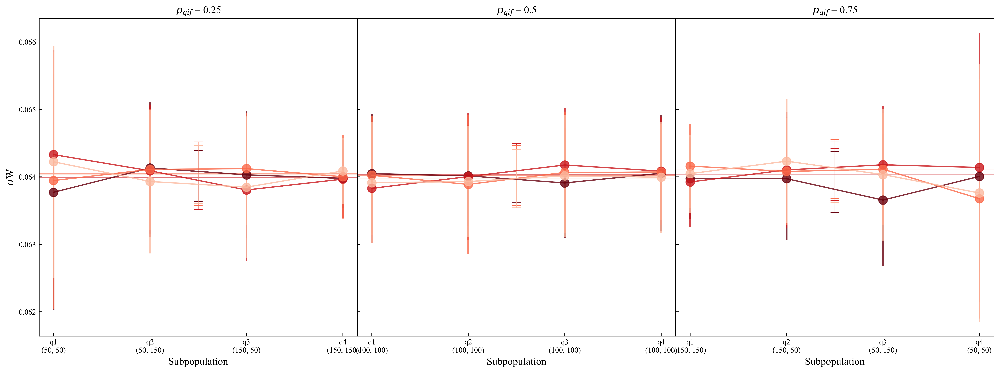

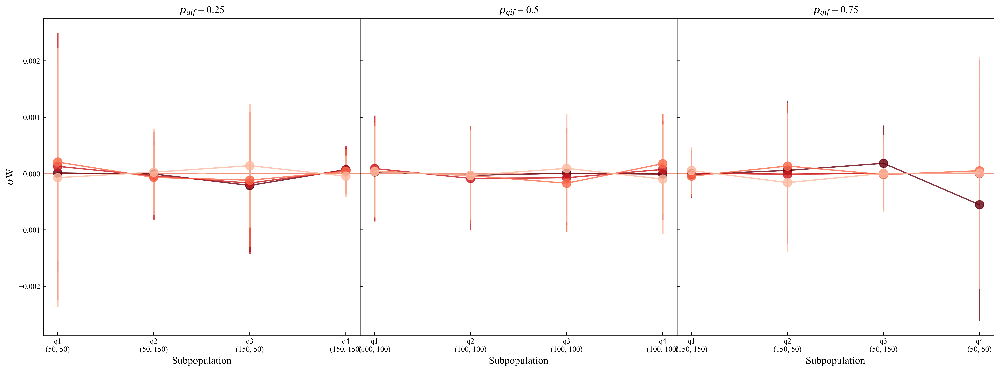

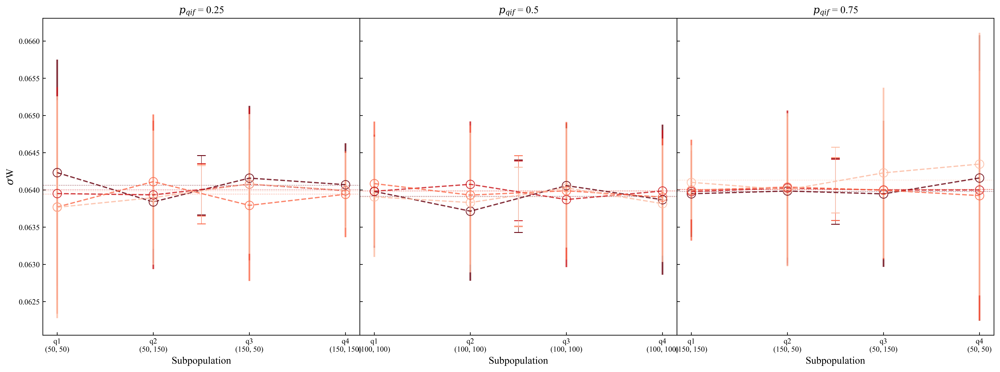

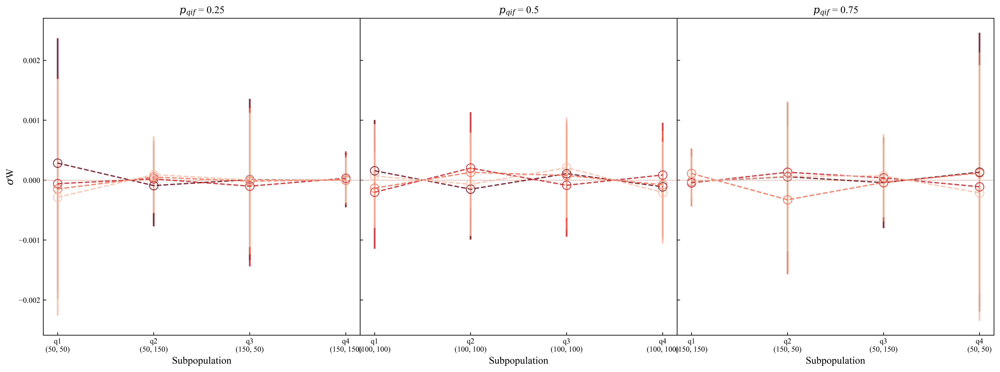

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys


########## Loop variables ##########
# Simulations
vrest = [-8.5, -12.3, -17, -22]
slope = [14.44, 10.68, 8.65, 7.18]

# pqif specific
slope_qif = 10.74
all_slopes = [14.44, 10.68, 10.74, 8.65, 7.18]
pqif_number = [0, 0.25, 0.5, 0.75, 1]
pqif_homogenous = [0, 1]
pqif_heterogenous = [0.25, 0.5, 0.75]

# Grouping
dynamics = ['oscillations', 'sequences']
# dynamics = ['oscillations']
seed_number = [i for i in range(0, 50)]

df = subpopDF.copy()

########## Figure variables ##########
x = [1, 2, 3, 4]  # x coordinates for q1...q4
q_i = [f"q{i}" for i in range(1, len(x) +1)]  # Gives a str list of quadrants
quantifications = ['std', 'mean']

for dyn in dynamics:

    #### Get correct simulaton numbers from dynamics
    if dyn == 'oscillations':
        simulation_number = [i for i in range(1,5)]
        fillstyle='full'
        linestyle='-'
    elif dyn == 'sequences':
        simulation_number = [i for i in range(9, 13)]
        fillstyle='none'
        linestyle='--'
    else:
        print('Invalid dynamics')
        sys.exit()

    for quantification in quantifications:  # Do the same for both mean and standard deviation

        # figname = f"{dyn}_heterogenous_subpopulations_quantification_{quantification}.svg"
        fig, axs = plt.subplots(
            nrows=1,
            ncols=3,
            sharex=False,
            sharey=True,
            figsize=(20, 16)
            )
        
        fig.subplots_adjust(
                hspace=0.1,
                wspace=0
            )

        for i, pqif in enumerate(pqif_heterogenous):  # (0.25, 0.5, 0.75)

            ax = axs[i]

            # Title and labels that depend on whether standard deviation of weights or mean of weights is y-value
            if quantification == f'std_{quantification}':
                title = f"$\sigma$W in subpopulations, pqif={pqif}"
                ylabel = f"$\sigma$W"
            elif quantification == f'mean_{quantification}':
                title = f"$\mu$W in subpopulations, pqif={pqif}"
                ylabel = f"$\mu$W"

            # X-ticks: Depend on what pqif is being plotted, so is added to list once for a figure. May not be used, but is helpful during analysis
            x_ticks = []
            ticked = False

            # In each figure, plot all simulations (all slopes)
            offset = np.linspace(-0.25, 0.25, len(simulation_number))
            for j, (sim, vr, f) in enumerate(zip(simulation_number, vrest, slope)):

                # y-value and y-error
                y = []
                yerr = []

                # For x tick labels
                shapes = []
                names = []
                quad_names = []

                # df = df_subpop.copy()


                ########## Per simulation, get values for each quadrant ##########
                for q in q_i:  # q1, ..., q4

                        # df_filtered = df_subpop[(df_subpop['sim'] == sim) & (df_subpop['pqif'] == pqif) & (df_subpop['quadrant'] == q)]  # for all simulations across pqif, take out each four quadrant

                        df_filtered = df[(df['dyn']==dyn) & (df['sim']==sim) & (df['pqif']==pqif) & (df['quadrant']==q)]  # Shall be all seeds of current version

                        # Y value
                        y.append(df_filtered[f"{quantification}_q"].mean())  # mean across seeds

                        # Yerr value
                        yerr.append(df_filtered[f"{quantification}_q"].std())  # standard deviation across seeds

                        #### Current quadrant (to be used in x-ticks)
                        # name = df_filtered['name'].unique()  # e.g. QIF --> LIF
                        assert df_filtered['quadrant'].nunique() == 1  # make sure it really is one condition
                        assert df_filtered['shape'].nunique() == 1

                        name = df_filtered['quadrant'].iloc[0]
                        # name = df_filtered['name'].unique()[0]  # equivalent method
                        shape = df_filtered['shape'].unique()  # e.g. (50, 150) which is (row, column) and (postsynaptic, presynaptic)
                        # quad = df_filtered['quadrant'].unique()  # q_i

                        # Formatting of X-tick labels
                        # name_formatted = name[0]
                        # shape_formatted = [f"({a} × {b})" for a, b in shape]

                        # ticks = f"{name[0]}\n{shape_formatted[0]}"
                        ticks = f"{name}\n{shape[0]}"

                        if ticked == False:
                            x_ticks.append(ticks)

                ticked = True  # X-ticks are made Only once for each pqif figure

                ########## Plot for each simulation ##########

                label = f"$F'$={f}"
                ax.errorbar(x, y, yerr, fmt='o', linestyle=linestyle, markersize=10, elinewidth=2, color=color_map_vrest[vr], fillstyle=fillstyle, alpha=0.8, label=label)  # Dodgered simulations

                # Optional: Include mean and sd for entire con. matrix
                df_filtered_2 = df[(df['dyn']==dyn) & (df['sim']==sim) & (df['pqif']==pqif)]
                y_fullcon = df_filtered_2[f'{quantification}_all'].mean()
                yerr_fullcon = df_filtered_2[f'{quantification}_all'].std()

                ax.axhline(y_fullcon, color=color_map_vrest[vr], linestyle=linestyle, alpha=0.6, linewidth=0.5)
                ax.errorbar(2.5, y_fullcon, yerr_fullcon, color=color_map_vrest[vr], capsize=5, linestyle=linestyle, linewidth=0.5)

                # ax.errorbar(x, [y_fullcon for _ in range(len(x))], [yerr_fullcon for _ in range(len(x))], color=color_map_vrest[vr], linestyle=linestyle)




            # xnam = ['QIF → QIF', 'LIF → QIF', 'QIF → LIF', 'LIF → LIF']
            ax.set_title(f"$p_{{qif}}$ = {pqif}")
            # ax.set_ylabel(ylabel)
            ax.set_xticks(x, q_i)
            ax.set_xticklabels(x_ticks)
            # ax.set_xlim(0.5, 4.5)
            # ax.tick_params(axis='x', pad=1)
            # if quantification == 'mean':
            #     ax.axhline(0, color='black')
            #     ax.set_ylim(-0.01, 0.08)
            # elif quantification == 'sd':
            #     ax.set_ylim(0.15, 0.36)
                
            # else:
            #     if dyn == 'oscillations':
            #         ax.set_ylim(0.22, 0.38)
            #     elif dyn == 'sequences':
            #         ax.set_ylim(0.15, 0.38)
            ax.set_xlabel(f"Subpopulation")
            ax.set_box_aspect(1)

        axs[0].set_ylabel(ylabel)



        # plt.savefig(os.path.join(figure_folder, figname))
        plt.show()
